# Transformation

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import PowerTransformer

train_data = pd.DataFrame({'var1':[1, 0.1, 1.5, 2]})
print("Mean of train data:", train_data['var1'].mean()) 
print("Std of train data:", train_data['var1'].std())


pt = PowerTransformer(method='box-cox')
pt.fit(train_data)
train_data_trans = pt.transform(train_data)
print("Transformed data:\n",train_data_trans)


print("Lambda:",pt.lambdas_) # Automatically selected 
print("Mean of transformed data:", np.mean(train_data_trans)) 
print("Std of transformed data:", np.std(train_data_trans))

Mean of train data: 1.15
Std of train data: 0.8103497187428812
Transformed data:
 [[-0.11830534]
 [-1.55167268]
 [ 0.53175441]
 [ 1.13822361]]
Lambda: [0.79614218]
Mean of transformed data: 0.0
Std of transformed data: 0.9999999999999999


In [2]:
import numpy as np
import pandas as pd

# for plotting
import matplotlib.pyplot as plt

# for Q-Q plots
import scipy.stats as stats

# the dataset for the demo
from sklearn.datasets import fetch_california_housing

In [3]:
# load the California House price data from Scikit-learn
X, y = fetch_california_housing(return_X_y=True, as_frame=True)

# display top 5 rows
X.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25


In [5]:
X.describe().T

,count,mean,std,min,25%,50%,75%,max
MedInc,20640.0,3.870671,1.899822,0.499900,2.563400,3.534800,4.743250,15.000100
HouseAge,20640.0,28.639486,12.585558,1.000000,18.000000,29.000000,37.000000,52.000000
AveRooms,20640.0,5.429000,2.474173,0.846154,4.440716,5.229129,6.052381,141.909091
AveBedrms,20640.0,1.096675,0.473911,0.333333,1.006079,1.048780,1.099526,34.066667
Population,20640.0,1425.476744,1132.462122,3.000000,787.000000,1166.000000,1725.000000,35682.000000
AveOccup,20640.0,3.070655,10.386050,0.692308,2.429741,2.818116,3.282261,1243.333333
Latitude,20640.0,35.631861,2.135952,32.540000,33.930000,34.260000,37.710000,41.950000
Longitude,20640.0,-119.569704,2.003532,-124.350000,-121.800000,-118.490000,-118.010000,-114.310000


In [6]:
plt.rcParams["figure.dpi"] = 450

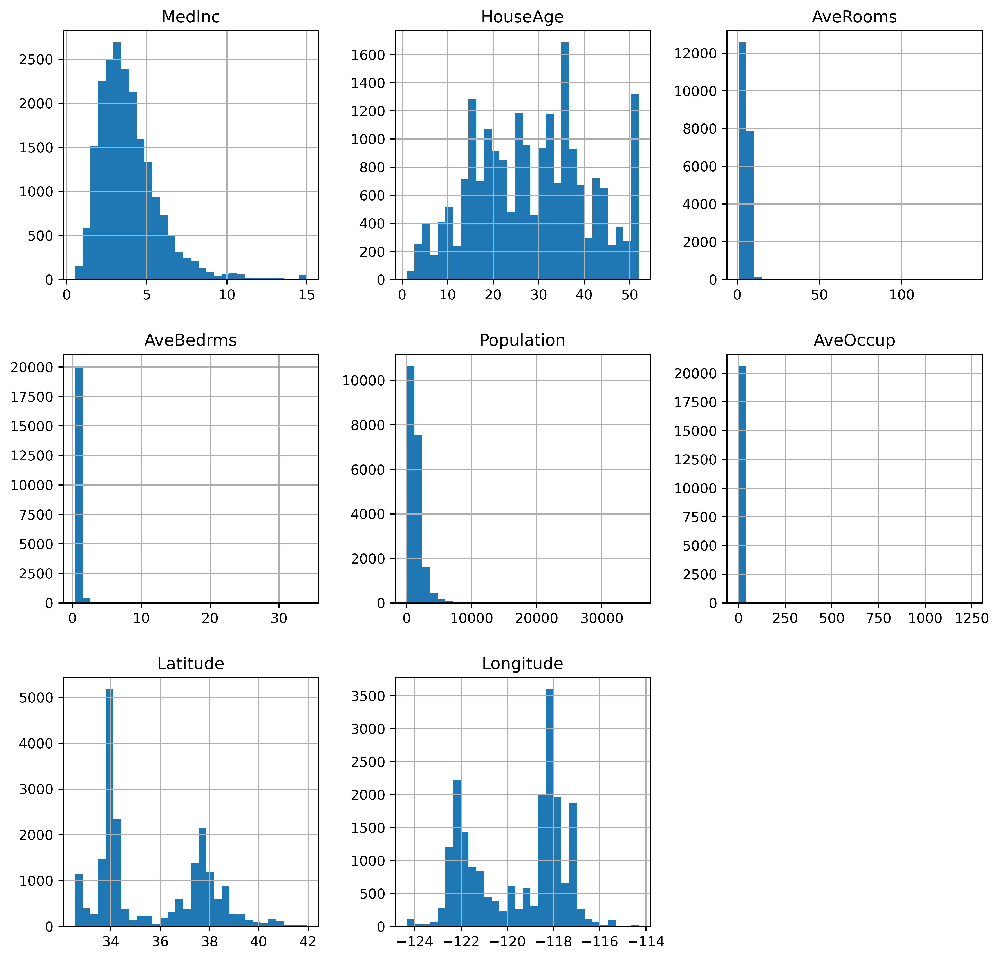

In [7]:
# Plot histograms to inspect variable distributions

X.hist(bins=30, figsize=(12, 12))
plt.show()

In [8]:
# Plot histogram and Q-Q plots to explore the variable distribution


def diagnostic_plots(df, variable):

    # function to plot a histogram and a Q-Q plot
    # side by side, for a certain variable

    plt.figure(figsize=(15, 6))

    # histogram
    plt.subplot(1, 2, 1)
    df[variable].hist(bins=30)
    plt.title(f"Histogram of {variable}")

    # q-q plot
    plt.subplot(1, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    plt.title(f"Q-Q plot of {variable}")

    plt.show()

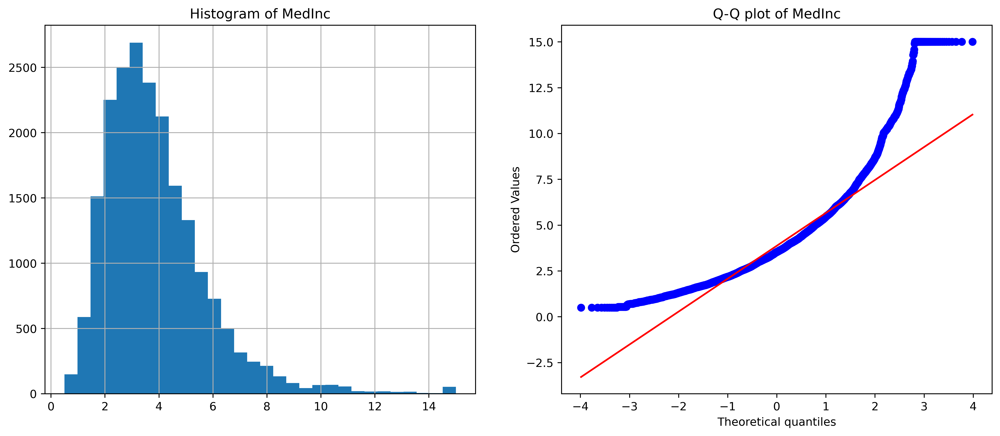

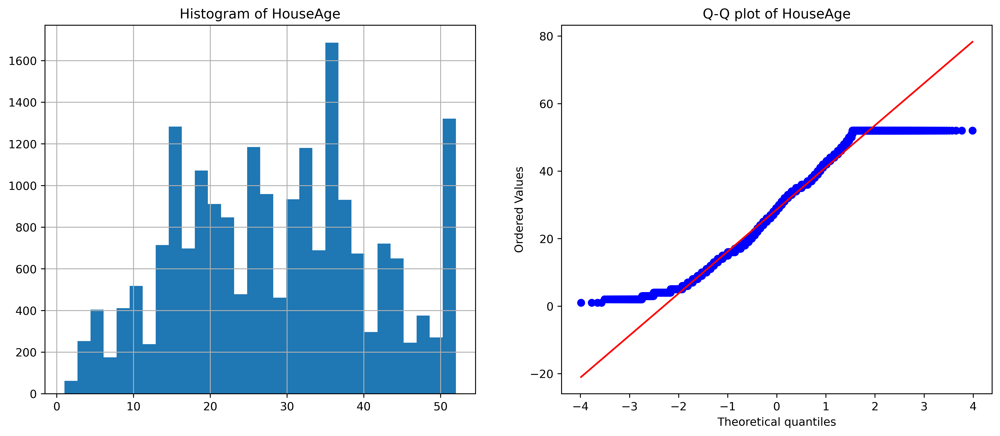

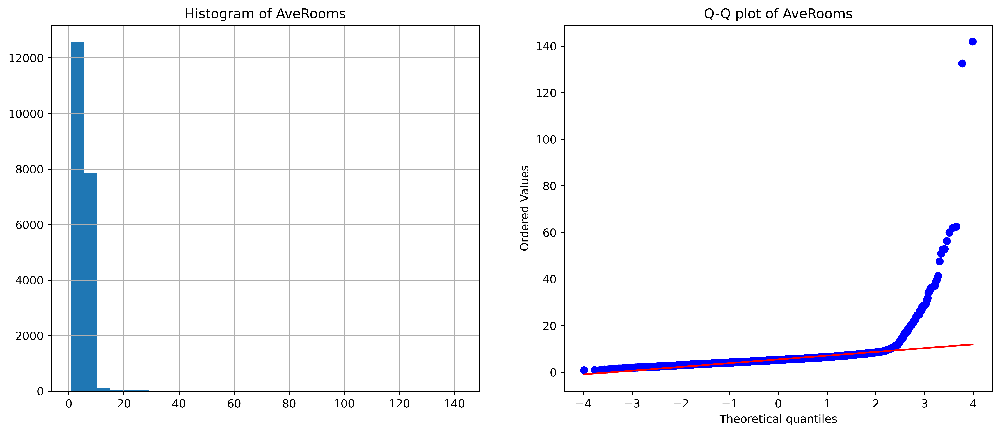

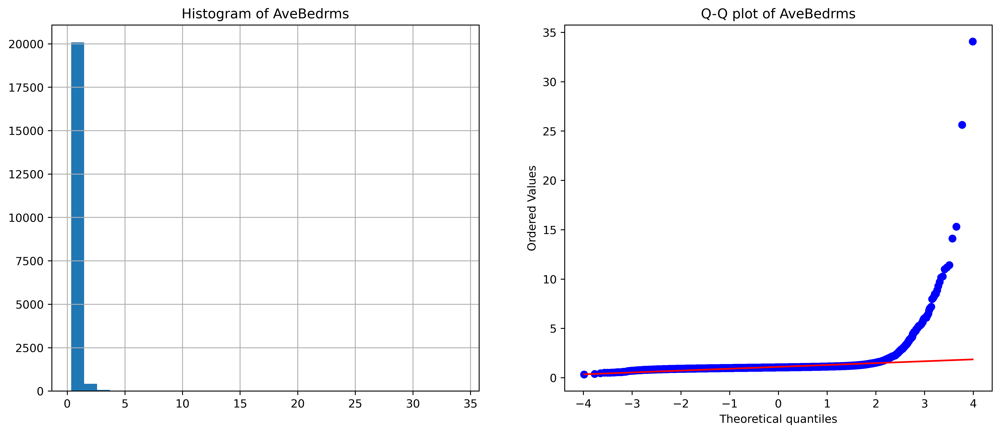

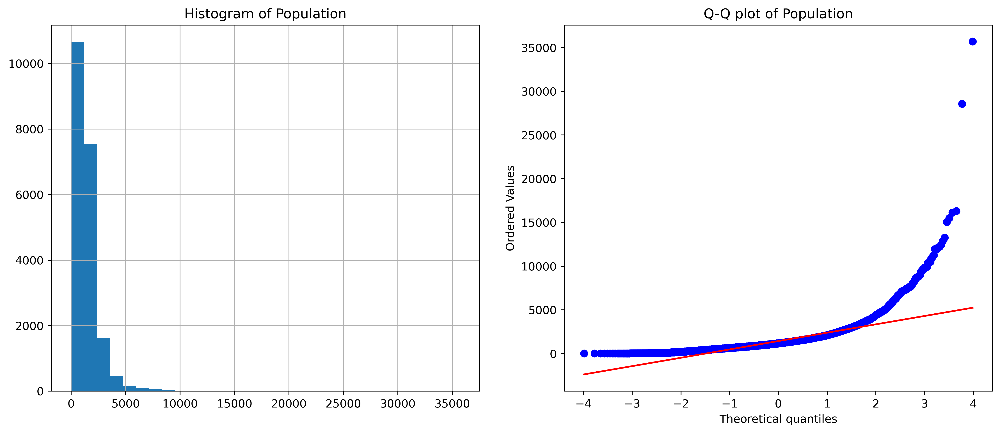

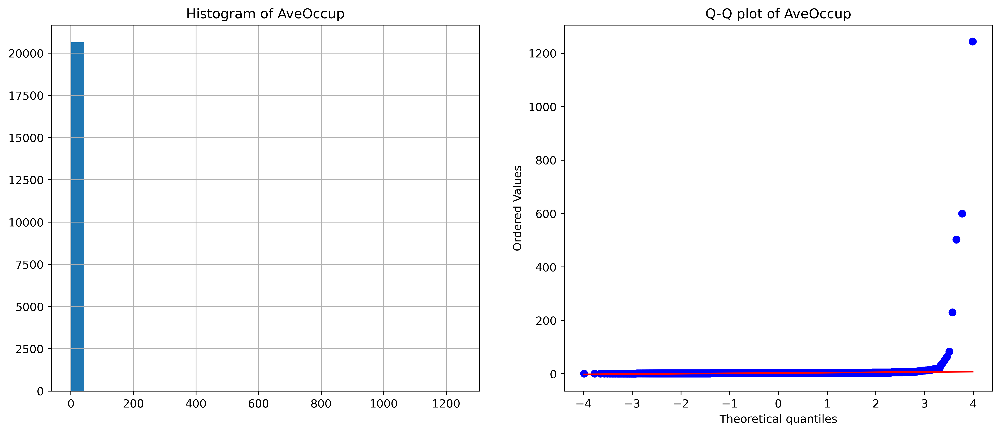

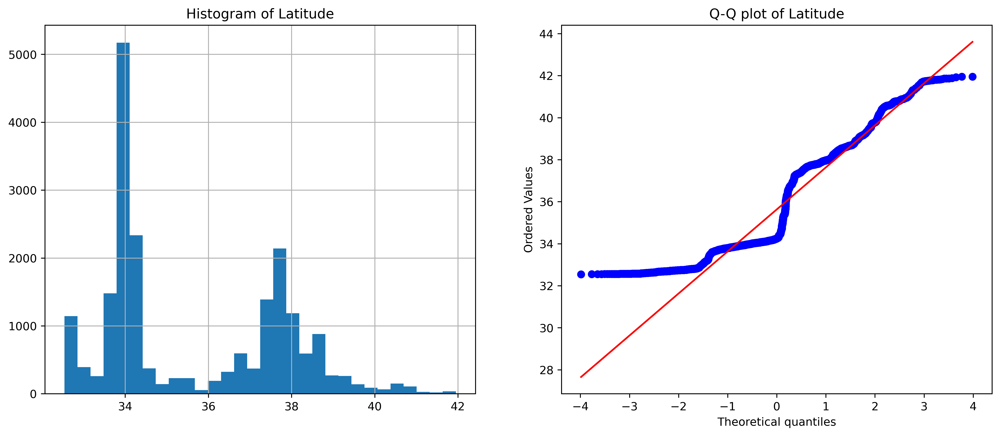

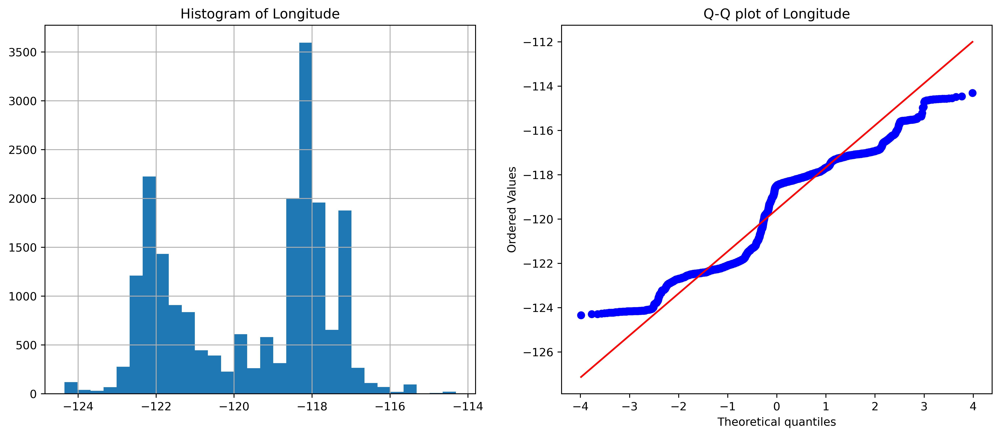

In [9]:
# Check function output

for var in X.columns:
    diagnostic_plots(X, var)

# Logarithmic transformation with NumPy

In [10]:
# make a copy of the dataframe where we will store the modified
# variables

X_tf = X.copy()

In [11]:
# list with the variables to transform

variables = ["MedInc", "AveRooms", "AveBedrms", "Population"]

In [12]:
# apply log to a set of variables

X_tf[variables] = np.log(X[variables])

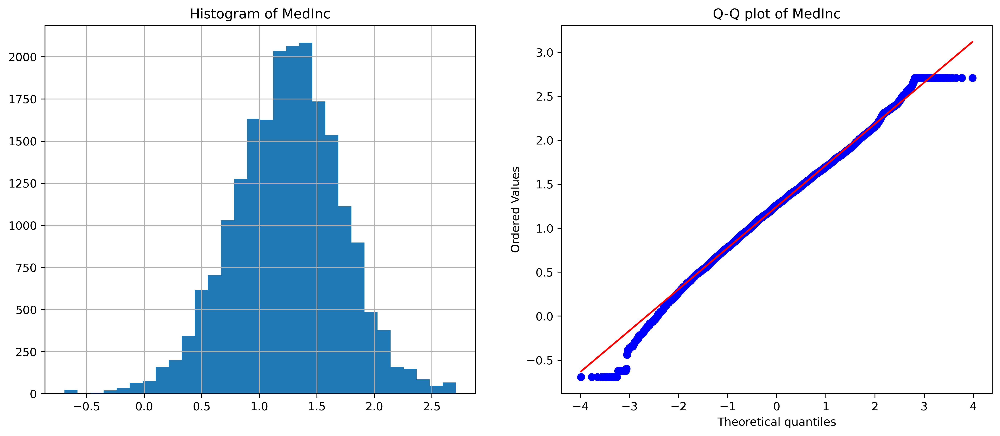

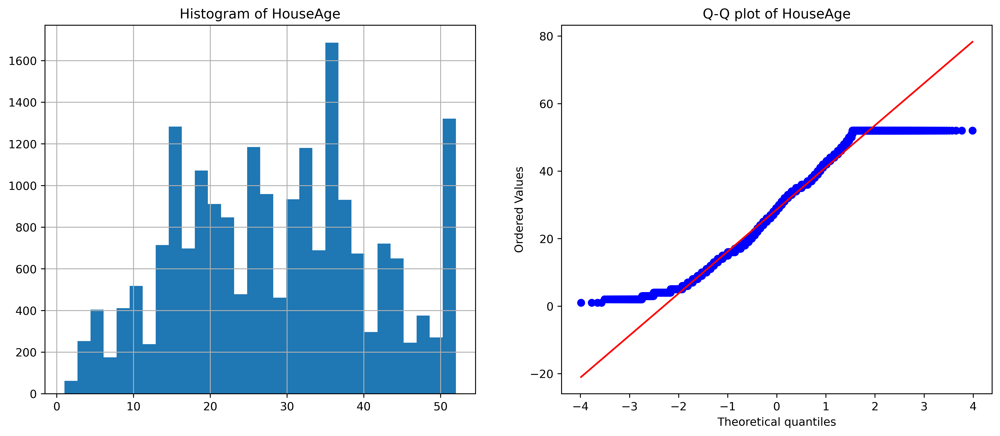

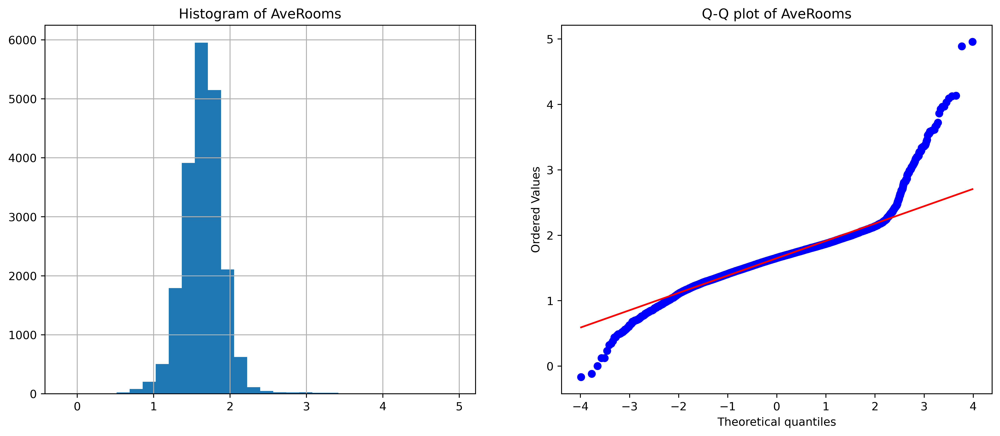

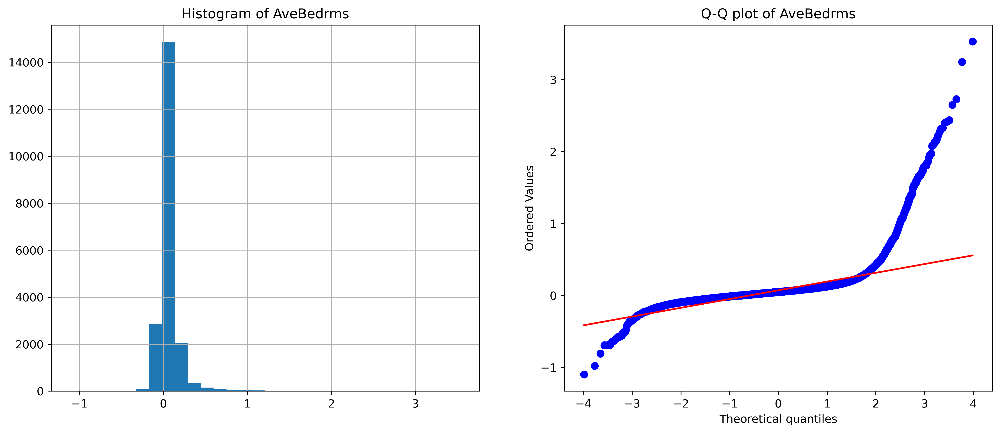

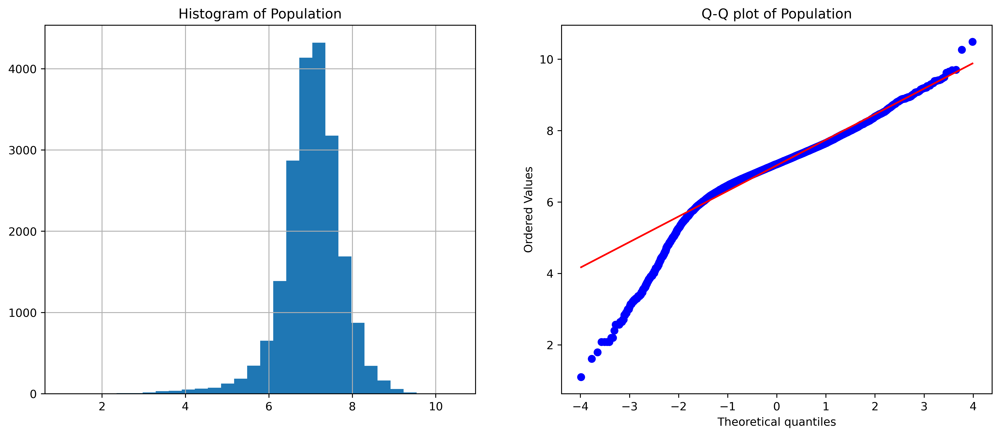

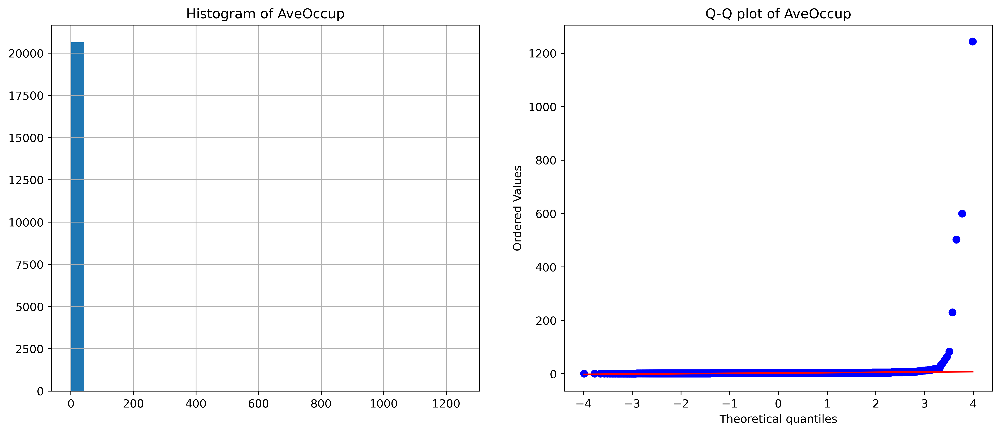

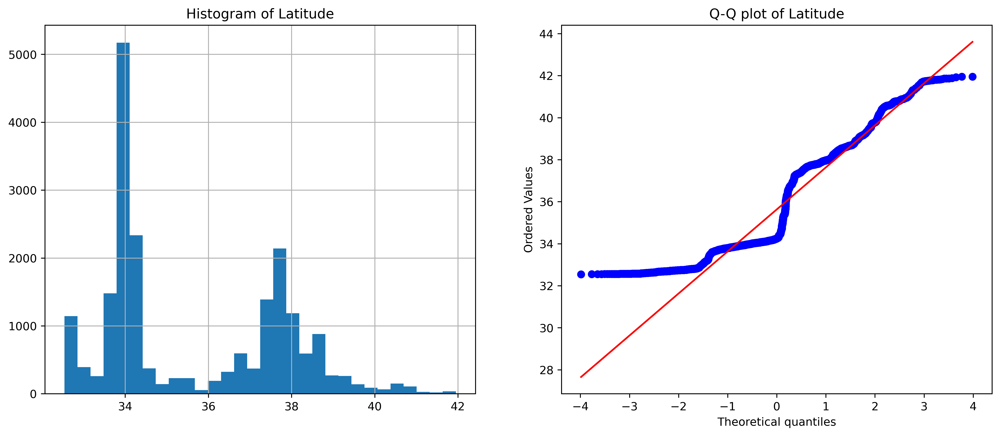

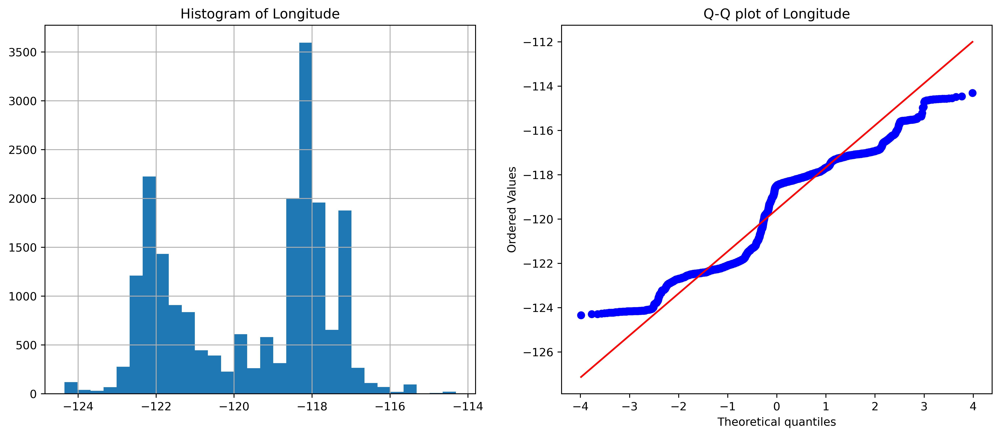

In [13]:
# use diagnostic plot function to corroborate variable transformation

for var in X_tf.columns:
    diagnostic_plots(X_tf, var)

# Logarithmic transformation with Scikit-learn

In [14]:
from sklearn.preprocessing import FunctionTransformer

In [15]:
# make a copy of the dataframe where we will store the modified
# variables

X_tf = X.copy()

In [16]:
# set up the transformer with NumPy log as parameter

transformer = FunctionTransformer(func=np.log, inverse_func=np.exp)

In [17]:
# transform subset of dataframe (remember that we
# made a copy earlier.)

X_tf[variables] = transformer.transform(X[variables])

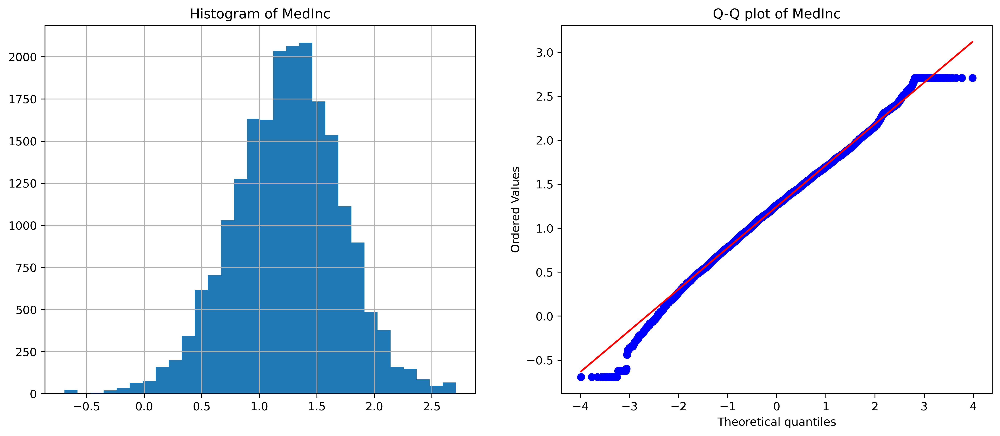

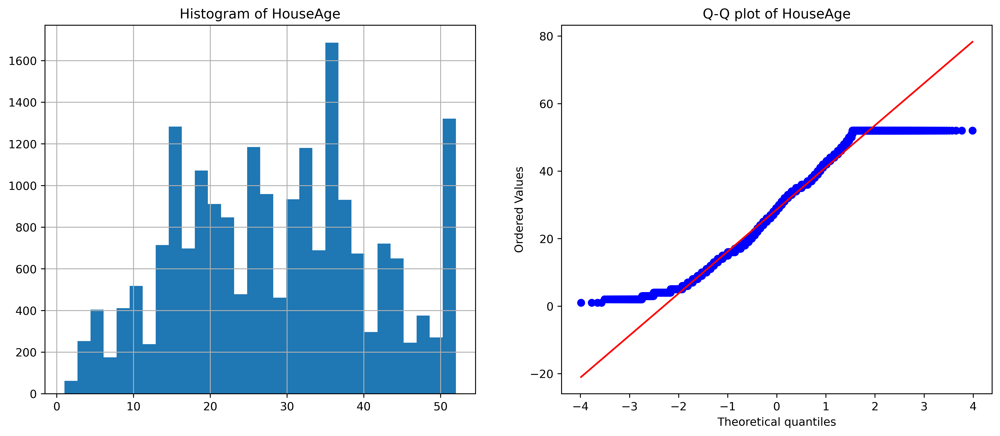

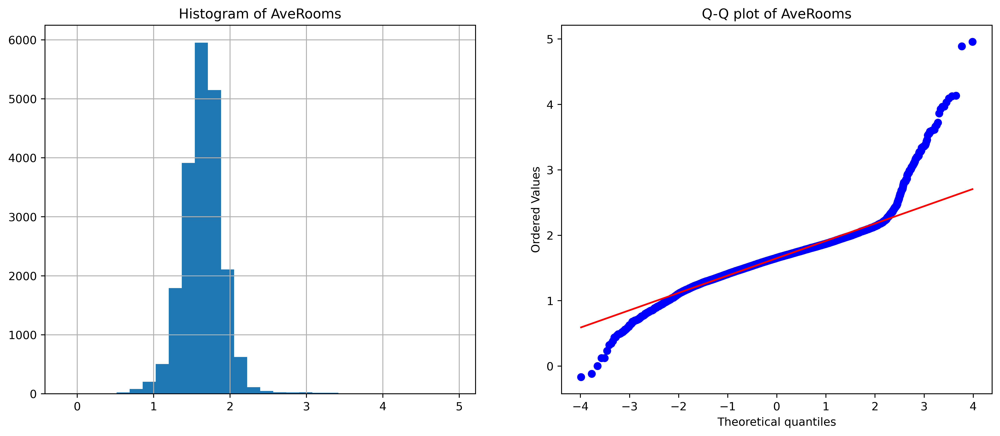

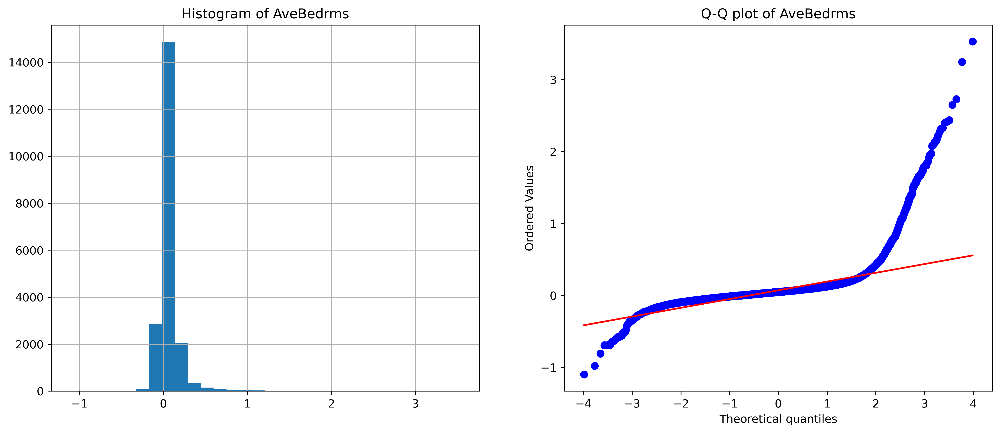

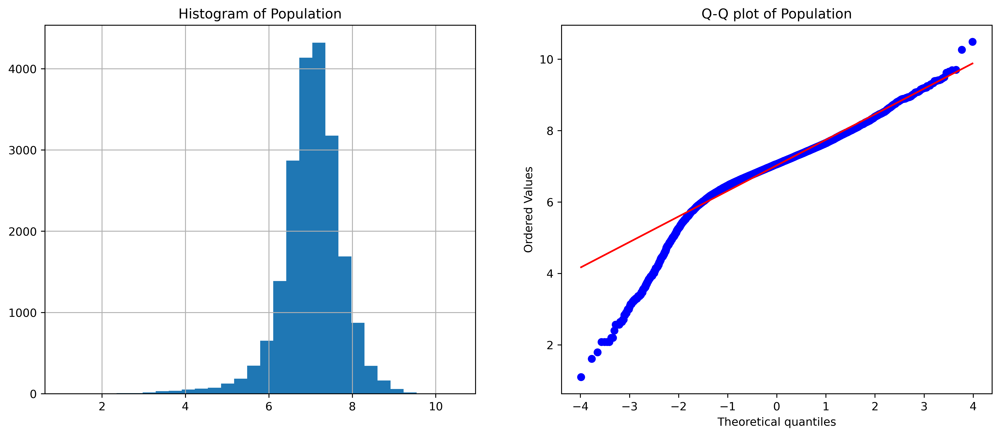

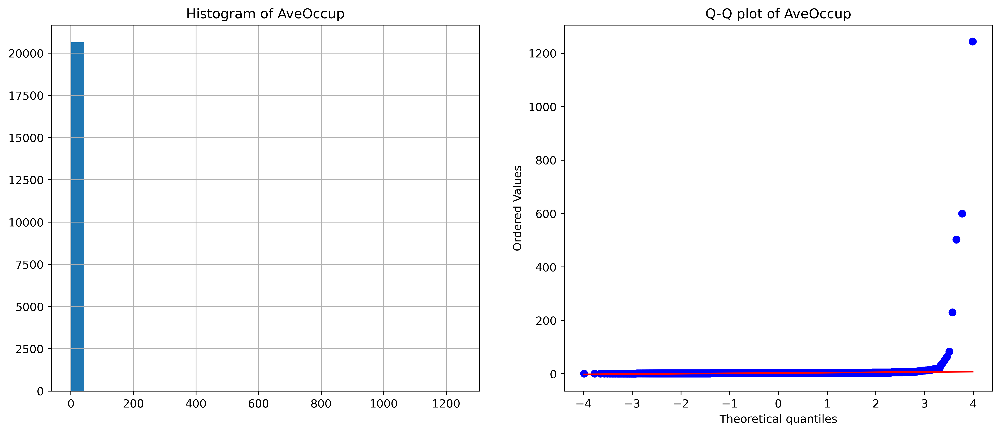

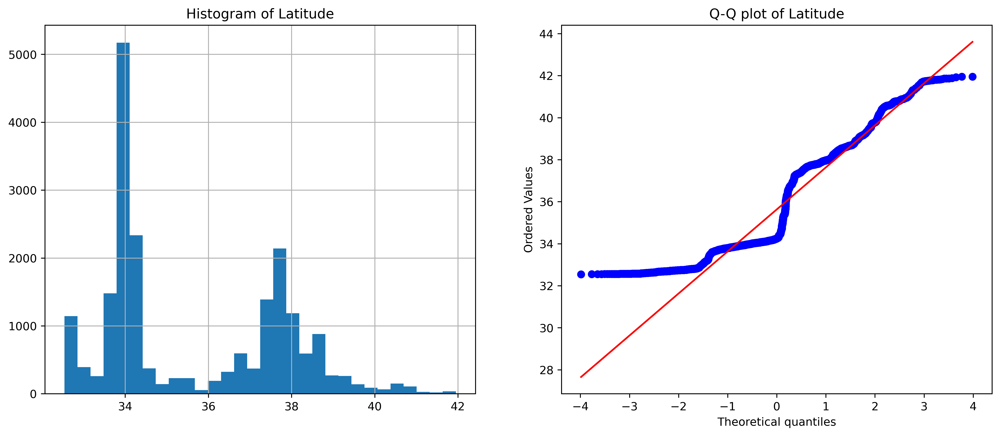

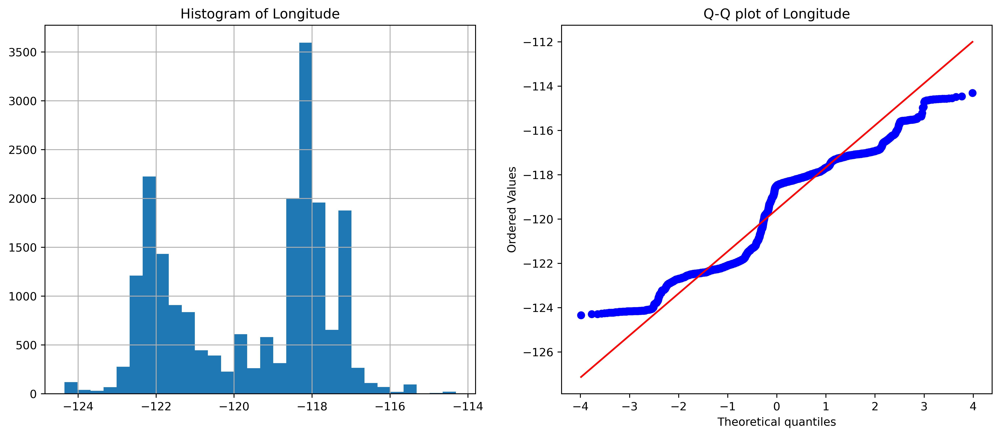

In [19]:
# use diagnostic plot function to corroborate variable transformation

for var in X_tf.columns:
    diagnostic_plots(X_tf, var)

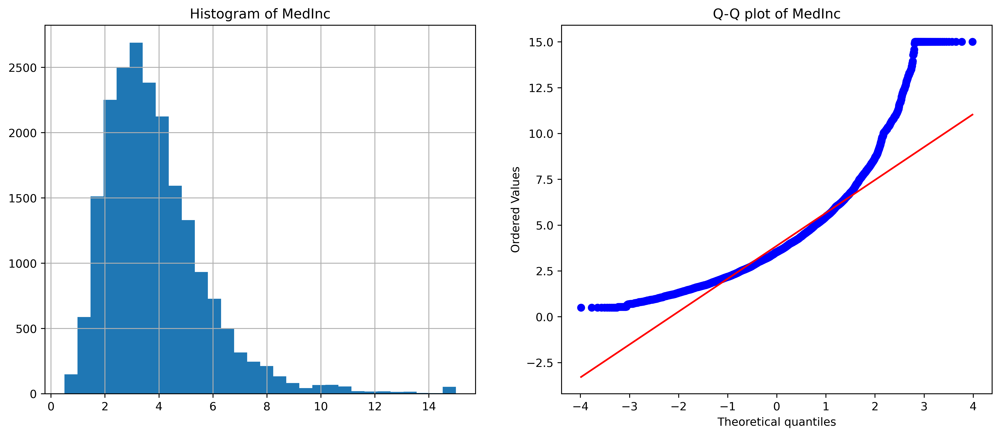

In [20]:
# revert to the original representation

X_tf[variables] = transformer.inverse_transform(X_tf[variables])

diagnostic_plots(X_tf, "MedInc")

# Reciprocal transformation

In [25]:
import numpy as np
import pandas as pd

# for plotting
import matplotlib.pyplot as plt

# for Q-Q plots
import scipy.stats as stats

# the dataset for the demo
from sklearn.datasets import fetch_california_housing

In [22]:
data = fetch_california_housing()

print(data.DESCR)

.. _california_housing_dataset:

California Housing dataset
--------------------------

**Data Set Characteristics:**

    :Number of Instances: 20640

    :Number of Attributes: 8 numeric, predictive attributes and the target

    :Attribute Information:
        - MedInc        median income in block group
        - HouseAge      median house age in block group
        - AveRooms      average number of rooms per household
        - AveBedrms     average number of bedrooms per household
        - Population    block group population
        - AveOccup      average number of household members
        - Latitude      block group latitude
        - Longitude     block group longitude

    :Missing Attribute Values: None

This dataset was obtained from the StatLib repository.
https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html

The target variable is the median house value for California districts,
expressed in hundreds of thousands of dollars ($100,000).

This dataset was derived

In [23]:
# load the California House price data from Scikit-learn
X, y = fetch_california_housing(return_X_y=True, as_frame=True)

# display top 5 rows
X.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25


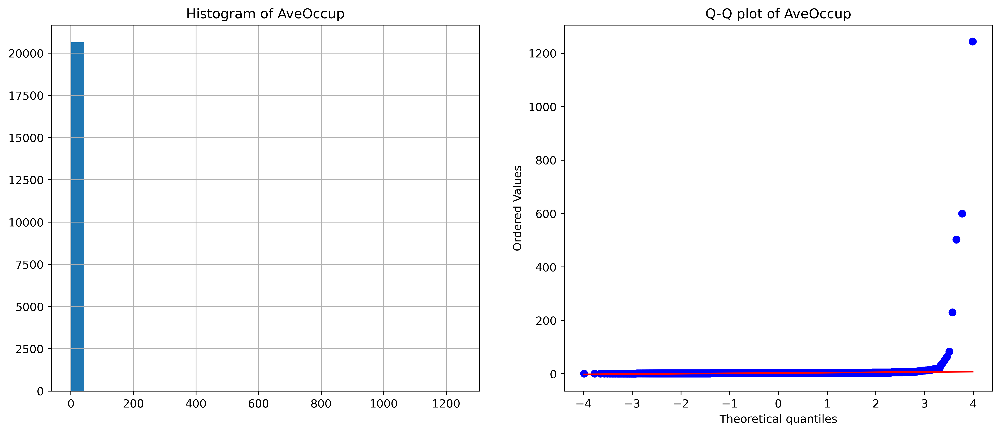

In [24]:
# Check function output

# AveOccup = average number of household members (number of people per household)
# AveOccup = number of members / number of houses

diagnostic_plots(X, "AveOccup")

# Reciprocal transformation with NumPy

In [26]:
# make a copy of the dataframe where we will store the modified
# variables

X_tf = X.copy()

In [28]:
X_tf

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25
...,...,...,...,...,...,...,...,...
20635,1.5603,25.0,5.045455,1.133333,845.0,2.560606,39.48,-121.09
20636,2.5568,18.0,6.114035,1.315789,356.0,3.122807,39.49,-121.21
20637,1.7000,17.0,5.205543,1.120092,1007.0,2.325635,39.43,-121.22
20638,1.8672,18.0,5.329513,1.171920,741.0,2.123209,39.43,-121.32


In [29]:
# apply the reciprocal to a set of variables

X_tf["HouseAge"] = np.reciprocal(X_tf["HouseAge"])

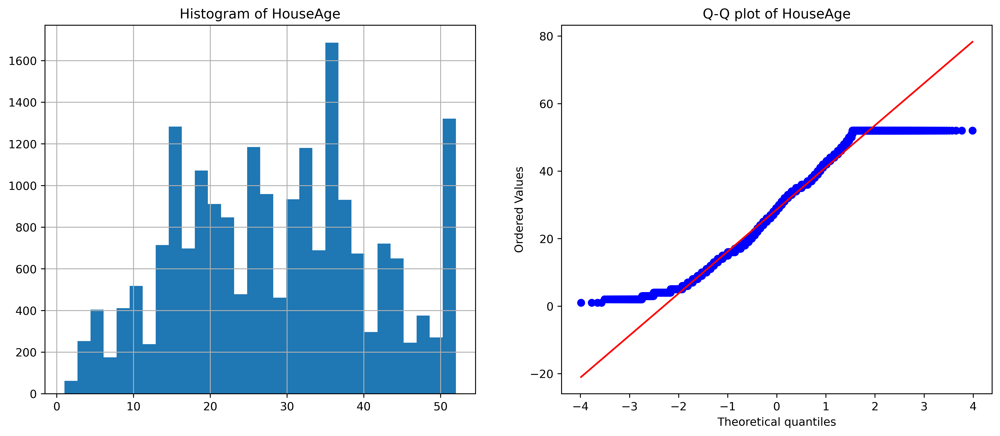

In [30]:
diagnostic_plots(X, "HouseAge")

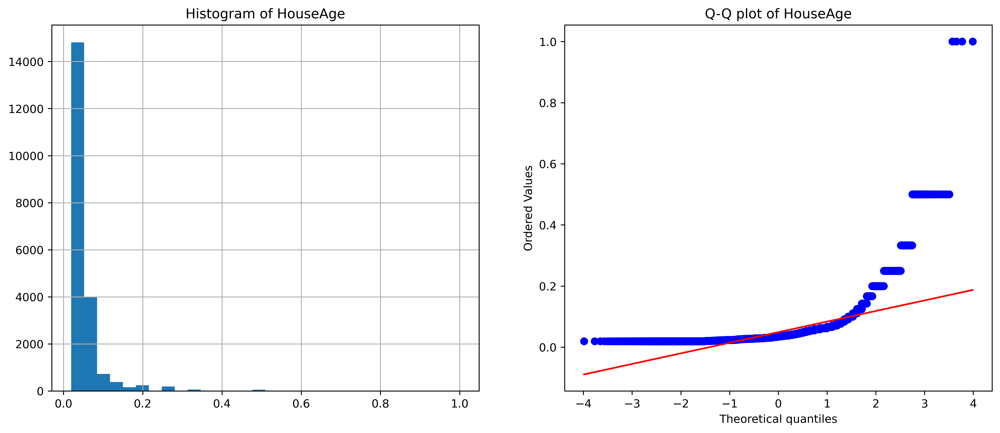

In [31]:
# use diagnostic plot function to corroborate variable transformation

# AveOccup = number of households per number of people)
# AveOccup = number of houses / number of people

diagnostic_plots(X_tf, "HouseAge")

# Reciprocal transformation with Scikit-learn

In [32]:
from sklearn.preprocessing import FunctionTransformer

In [33]:
# make a copy of the dataframe where we will store the modified
# variables

X_tf = X.copy()

In [34]:
# start the transformer with NumPy reciprocal as parameter

transformer = FunctionTransformer(func=np.reciprocal)

In [35]:
# transform subset of dataframe

X_tf["AveOccup"] = transformer.transform(X["AveOccup"])

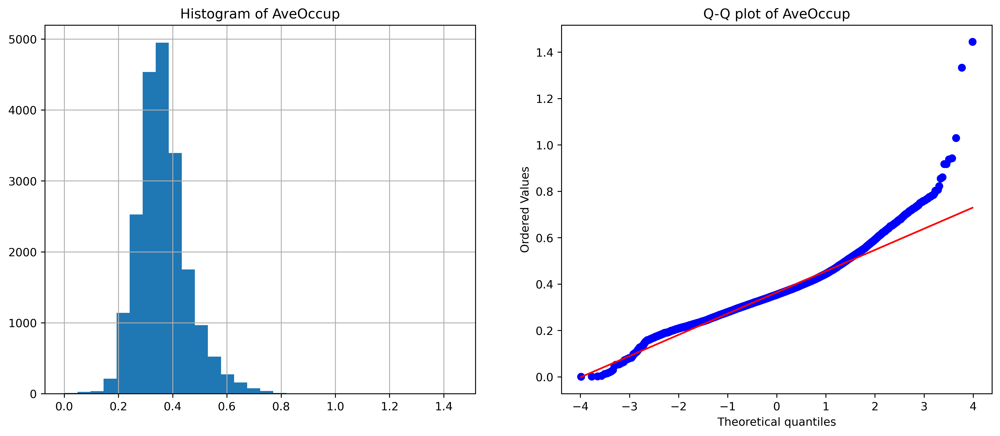

In [36]:
# use diagnostic plot function to corroborate variable transformation

diagnostic_plots(X_tf, "AveOccup")

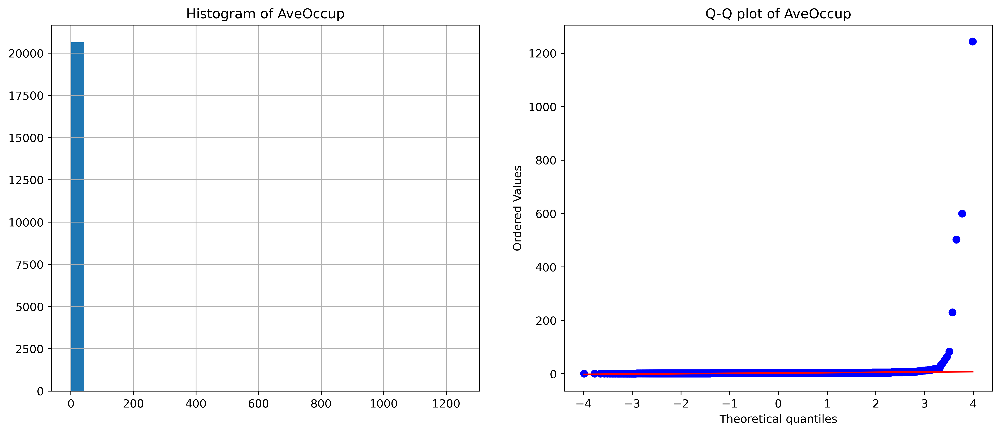

In [37]:
diagnostic_plots(X, "AveOccup")

# Square-root transformation

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as stats

In [39]:
# create dataframe
df = pd.DataFrame()

# draw samples from a poisson distribution
df["counts1"] = stats.poisson.rvs(mu=3, size=10000)
df["counts2"] = stats.poisson.rvs(mu=2, size=10000)

# display top rows
df.head()

,counts1,counts2
0,3,1
1,3,2
2,3,5
3,1,1
4,2,5


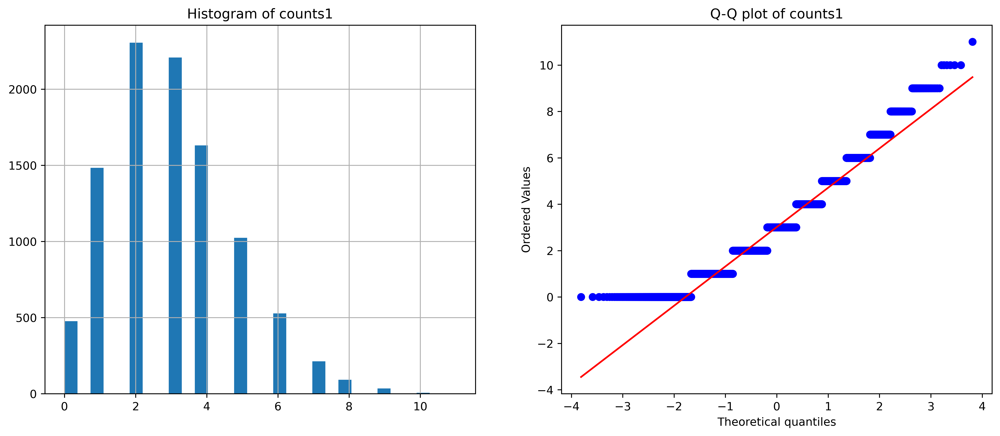

In [40]:
diagnostic_plots(df, "counts1")

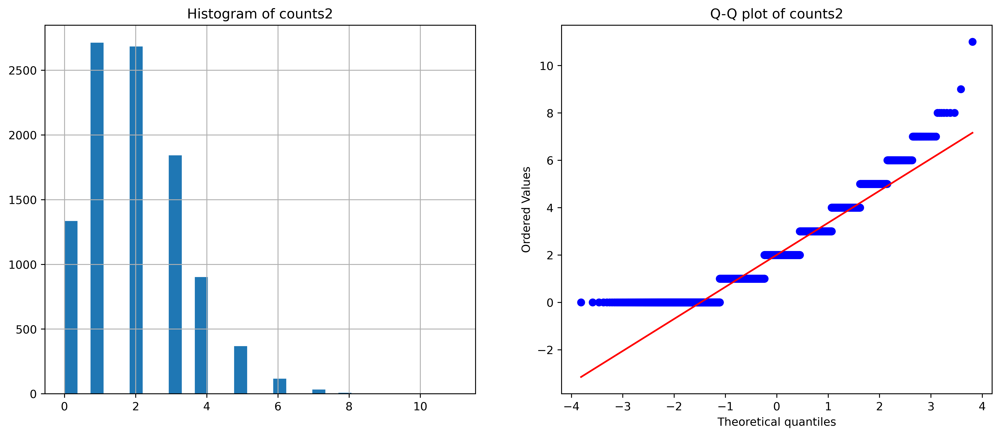

In [41]:
diagnostic_plots(df, "counts2")

# Square root with NumPy

In [42]:
# make a copy of the dataframe

df_tf = df.copy()

In [43]:
# apply square root transformation

df_tf[["counts1", "counts2"]] = np.sqrt(df[["counts1", "counts2"]])

df_tf[["counts1", "counts2"]] = np.round(df_tf[["counts1", "counts2"]], 2)

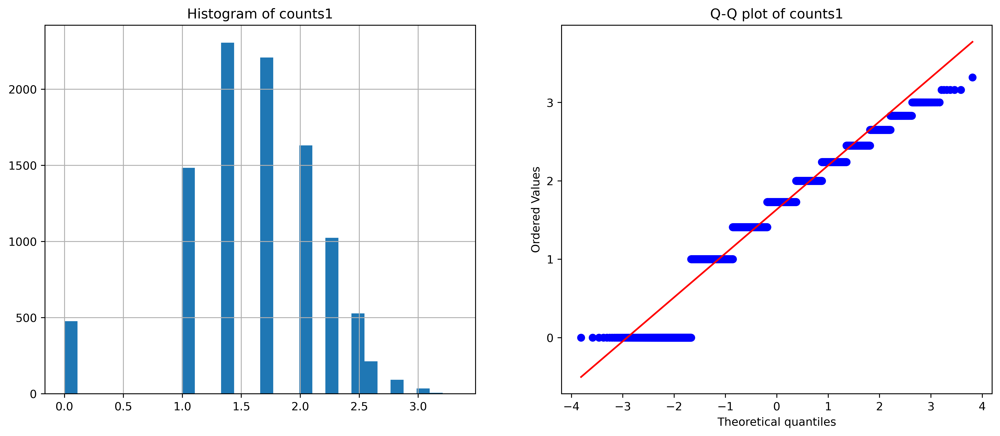

In [44]:
diagnostic_plots(df_tf, "counts1")

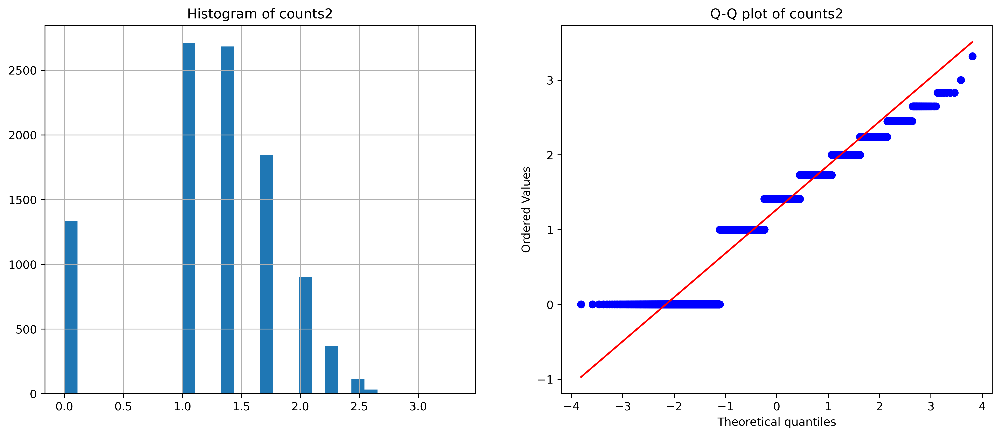

In [45]:
diagnostic_plots(df_tf, "counts2")

# Square root with Scikit-learn

In [46]:
from sklearn.preprocessing import FunctionTransformer

In [47]:
# make a copy of the data

df_tf = df.copy()

In [48]:
# set up transformer with desired operations

transformer = FunctionTransformer(func = lambda x: np.round(np.sqrt(x), 2))

In [49]:
# transform slice of dataframe with variables to transform

df_tf = transformer.transform(df[["counts1", "counts2"]])

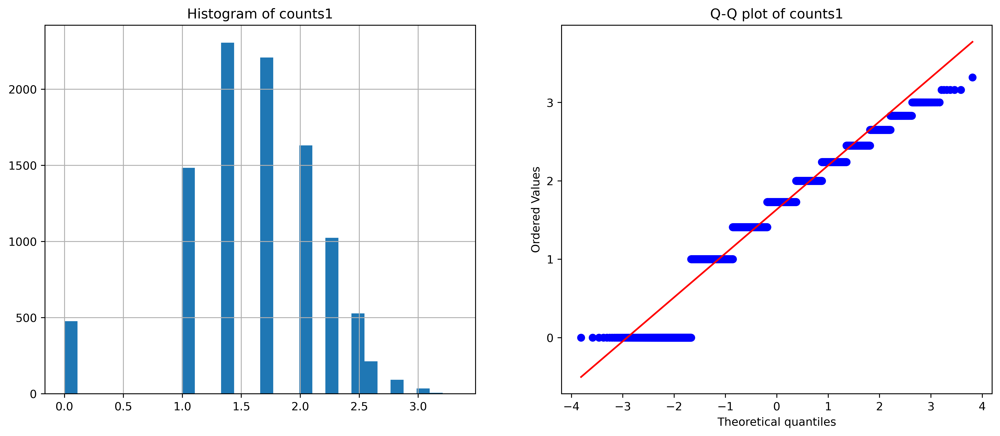

In [50]:
# check distribution of transformed variable

diagnostic_plots(df_tf, "counts1")

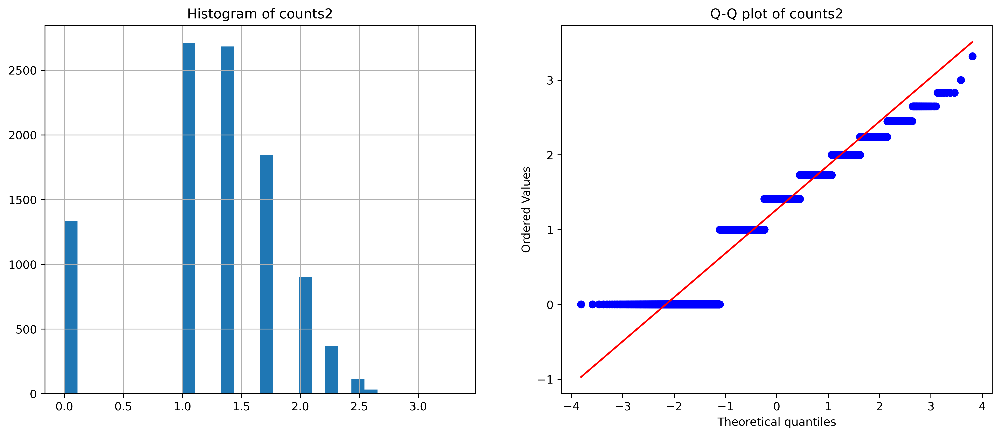

In [51]:
# check distribution of transformed variable

diagnostic_plots(df_tf, "counts2")

# Power transformation

In [52]:
import numpy as np
import pandas as pd

# for plotting
import matplotlib.pyplot as plt

# for Q-Q plots
import scipy.stats as stats

# the dataset for the demo
from sklearn.datasets import fetch_california_housing

# with open-source packages
from sklearn.preprocessing import FunctionTransformer

In [53]:
# load the California House price data from Scikit-learn
X, y = fetch_california_housing(return_X_y=True, as_frame=True)

# display top 5 rows
X.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25


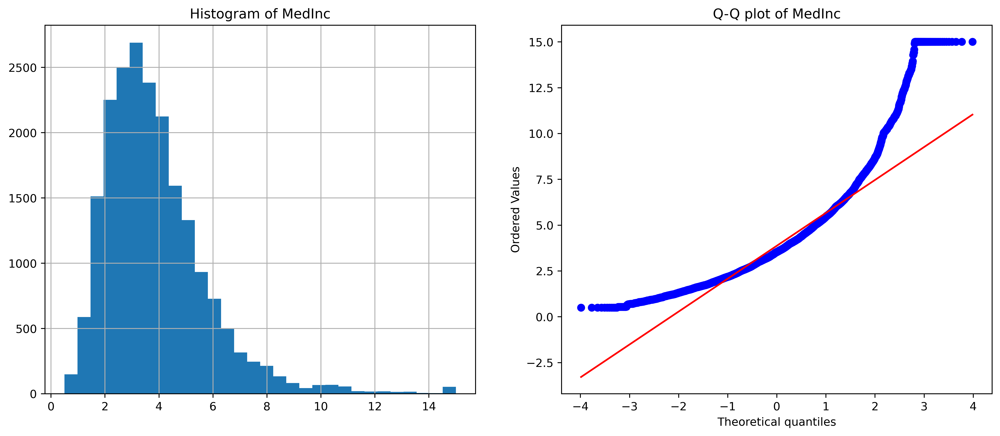

In [54]:
# check original distribution (not included in this recipe of book)

diagnostic_plots(X, "MedInc")

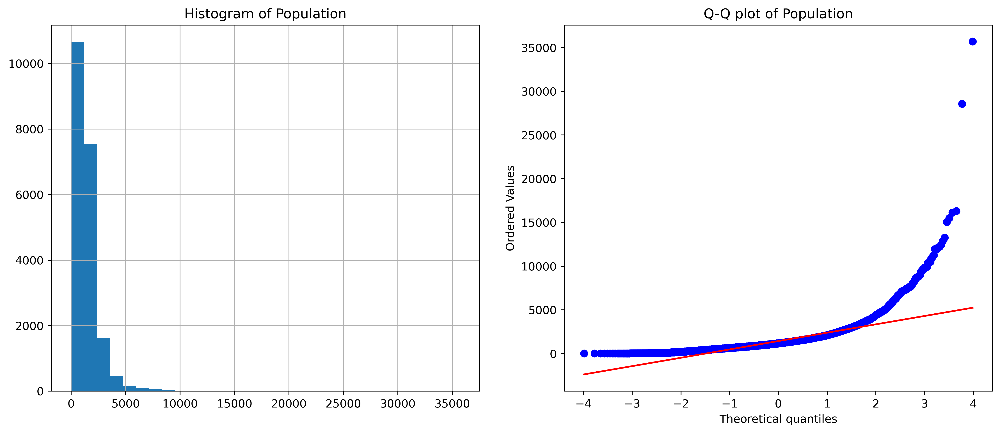

In [55]:
diagnostic_plots(X, "Population")

# Power transformation with NumPy

In [56]:
# make a copy of the dataframe where we will store the modified
# variables

X_tf = X.copy()

In [57]:
# make a list with the variables to transform

variables = ["MedInc", "Population"]

In [58]:
# apply a 0.3 exponent power transformation to a set of variables

X_tf[variables] = np.power(X[variables], 0.3)

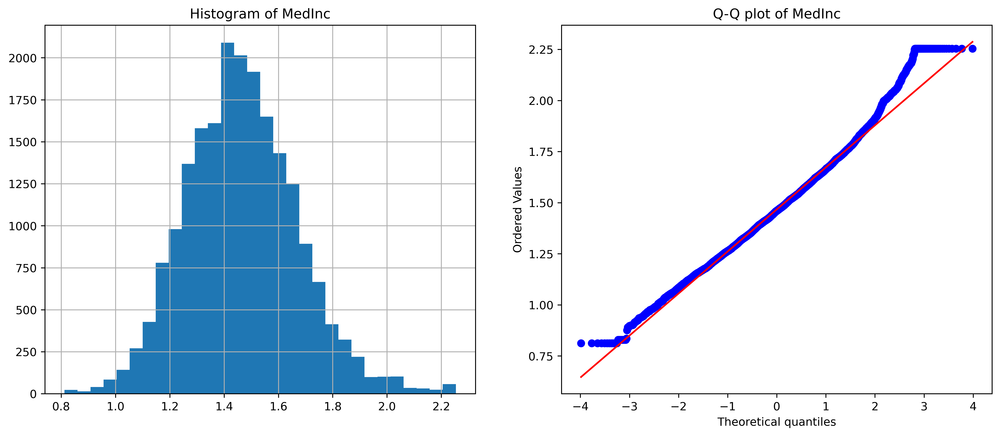

In [59]:
# check the distribution of the transformed variable

diagnostic_plots(X_tf, "MedInc")

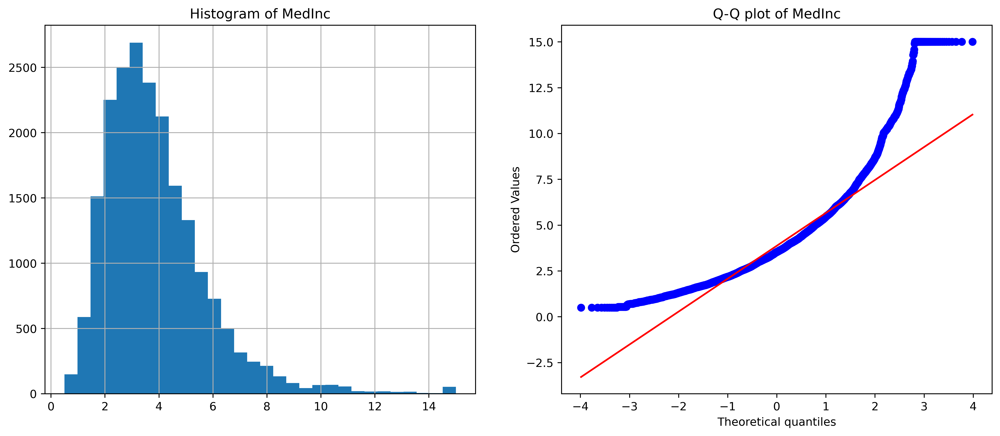

In [60]:
diagnostic_plots(X, "MedInc")

<AxesSubplot:ylabel='Density'>

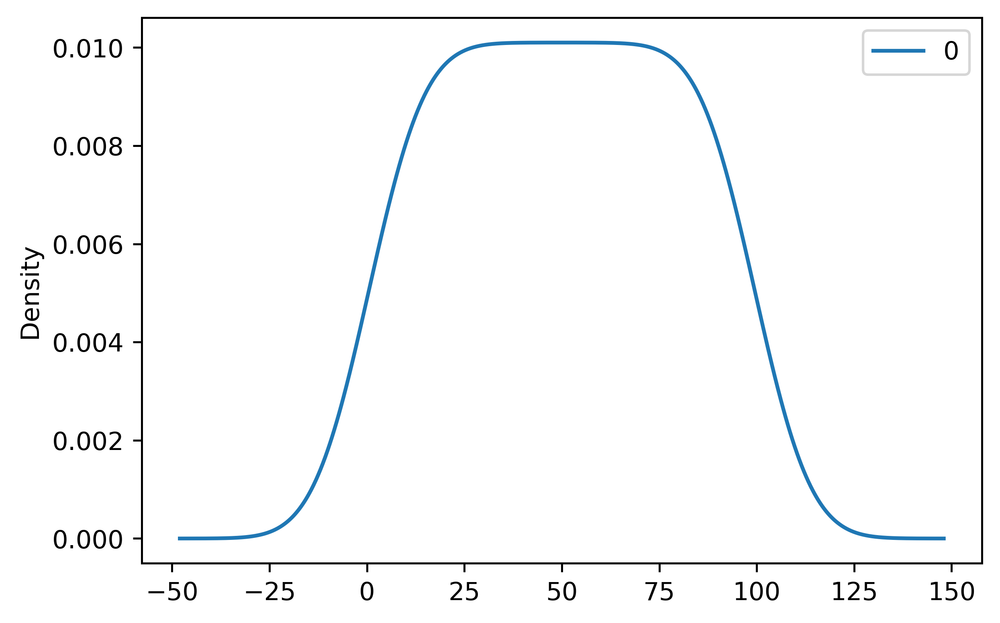

In [216]:
pd.DataFrame(list(range(1,100))).plot.density()

<AxesSubplot:ylabel='Density'>

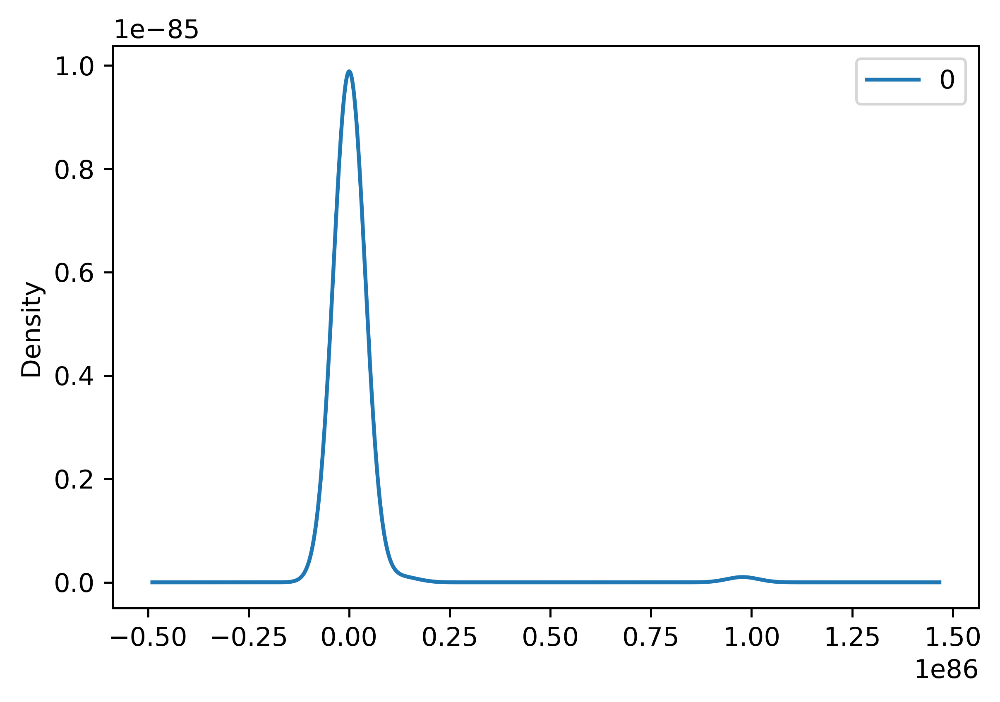

In [226]:
pd.DataFrame(np.power(np.exp(list(range(1,100))),2)).plot.density()

## Power transformation with Scikit-learn

In [61]:
# make a copy of the dataframe where we will store the modified
# variables

X_tf = X.copy()

In [62]:
# set up the transformer with a user defined function, in this
# case the 0.3 power transformation

transformer = FunctionTransformer(lambda x: np.power(x, 0.3))

In [63]:
# transform slice of dataframe with indicated variables

X_tf[variables] = transformer.transform(X[variables])

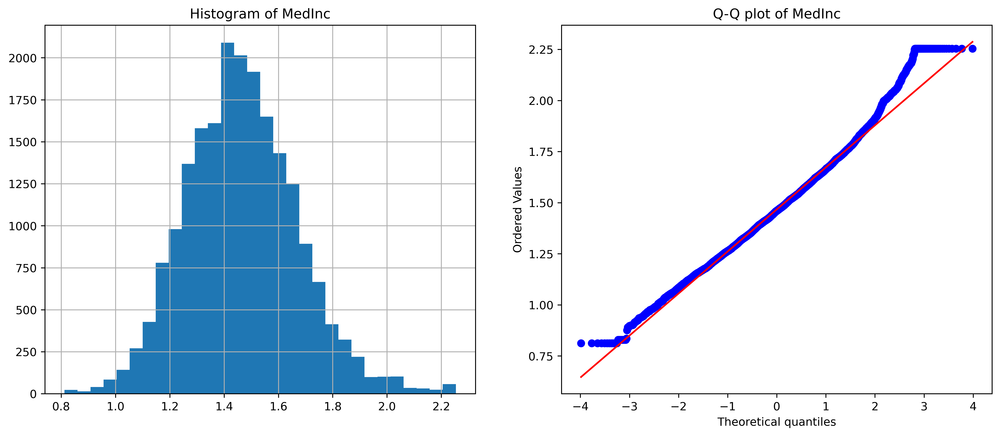

In [64]:
# visualize the transformation (not in book)

diagnostic_plots(X_tf, "MedInc")

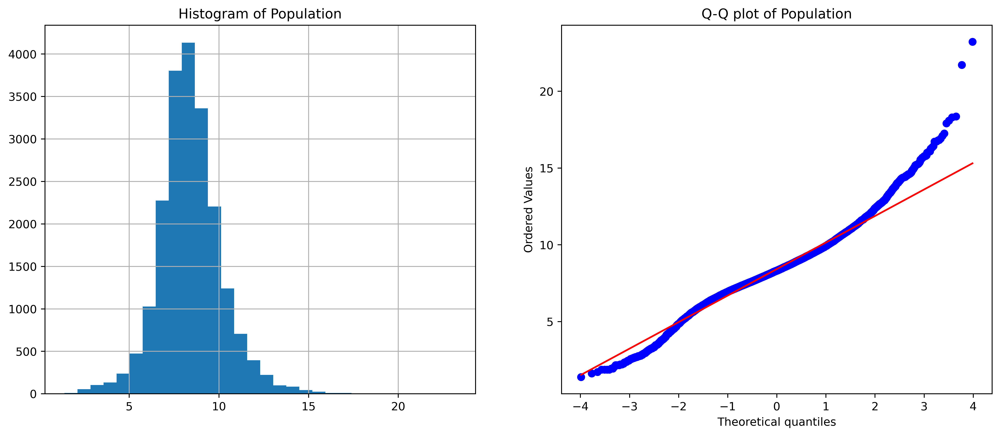

In [65]:
diagnostic_plots(X_tf, "Population")

# Box-Cox transformation

In [66]:
import pandas as pd

# for plotting
import matplotlib.pyplot as plt

# for Q-Q plots
import scipy.stats as stats

# the dataset for the demo
from sklearn.datasets import fetch_california_housing

# with open-source packages
from sklearn.preprocessing import PowerTransformer


In [67]:
# load the California House price data from Scikit-learn
X, y = fetch_california_housing(return_X_y=True, as_frame=True)

# drop lat and lon
X.drop(labels=["Latitude", "Longitude"], axis=1, inplace=True)

# display top 5 rows
X.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467


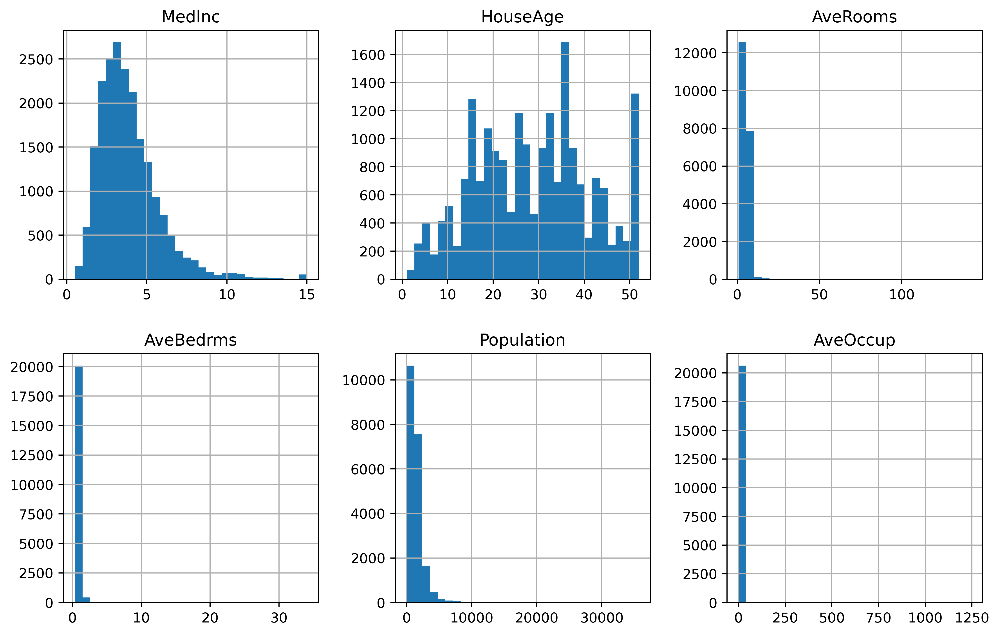

In [68]:
# Plot histograms to inspect variable distributions

X.hist(bins=30, figsize=(12, 12), layout=(3, 3))
plt.show()

In [69]:
# capture variable names in a list

variables = list(X.columns)

variables

['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup']

In [70]:
# Make Q-Q plots for all variables


def make_qqplot(df):

    plt.figure(figsize=(10, 6), constrained_layout=True)

    for i in range(6):

        # location in figure
        ax = plt.subplot(2, 3, i + 1)

        # variable to plot
        var = variables[i]

        # q-q plot
        stats.probplot((df[var]), dist="norm", plot=plt)

        # add variable name as title
        ax.set_title(var)

    plt.show()

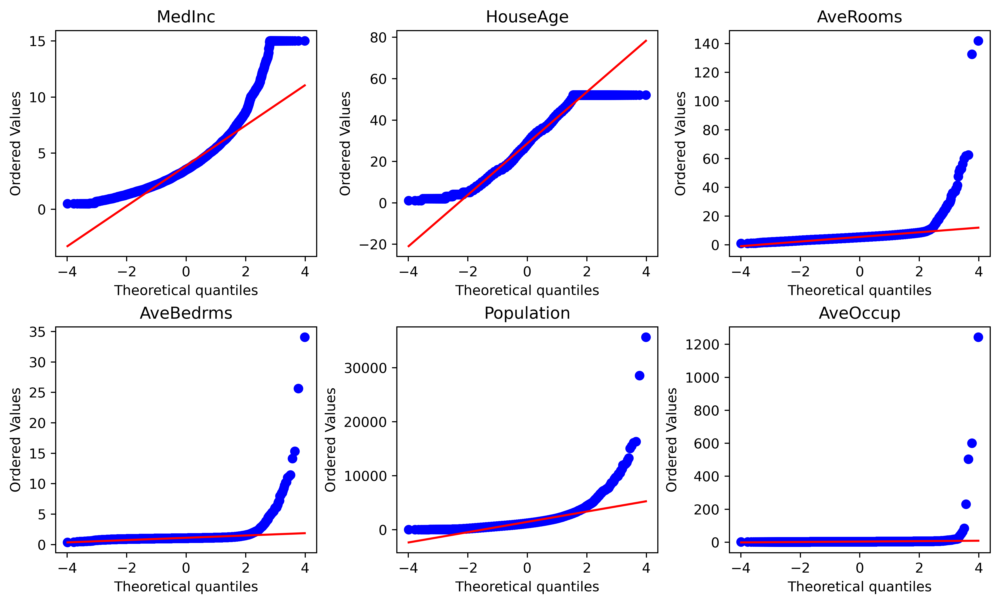

In [71]:
make_qqplot(X)

# Box-Cox transformation with Scikit-learn

In [72]:
# initialize the transformer with box-cox

transformer = PowerTransformer(method="box-cox", standardize=False)

In [73]:
# fit transformer: transformer will learn the lambdas

transformer.fit(X)

PowerTransformer(method='box-cox', standardize=False)

In [74]:
# lambdas are stored in a transformer attribute

transformer.lambdas_

array([ 0.09085449,  0.80939809, -0.2980049 , -1.62900026,  0.23576758,
       -0.47630323])

In [75]:
# transform data: returns NumPy array

X_tf = transformer.transform(X)

X_tf

array([[ 2.33706858e+00,  2.37232164e+01,  1.47534996e+00,
         2.30852288e-02,  1.23081165e+01,  7.56645476e-01],
       [ 2.33359826e+00,  1.32869543e+01,  1.41097764e+00,
        -2.91954350e-02,  2.23353410e+01,  6.28291074e-01],
       [ 2.17169053e+00,  2.90174591e+01,  1.56886594e+00,
         6.69359792e-02,  1.40826537e+01,  8.14314548e-01],
       ...,
       [ 5.43627084e-01,  1.10039339e+01,  1.30322965e+00,
         1.03551405e-01,  1.74122740e+01,  6.94971200e-01],
       [ 6.42492996e-01,  1.15834800e+01,  1.31757456e+00,
         1.39801581e-01,  1.59016207e+01,  6.32710121e-01],
       [ 9.06073643e-01,  1.04178493e+01,  1.30897227e+00,
         1.33369186e-01,  1.91100827e+01,  7.71751676e-01]])

In [76]:
# transform NumPy array to pandas dataframe

X_tf = pd.DataFrame(X_tf, columns=variables)

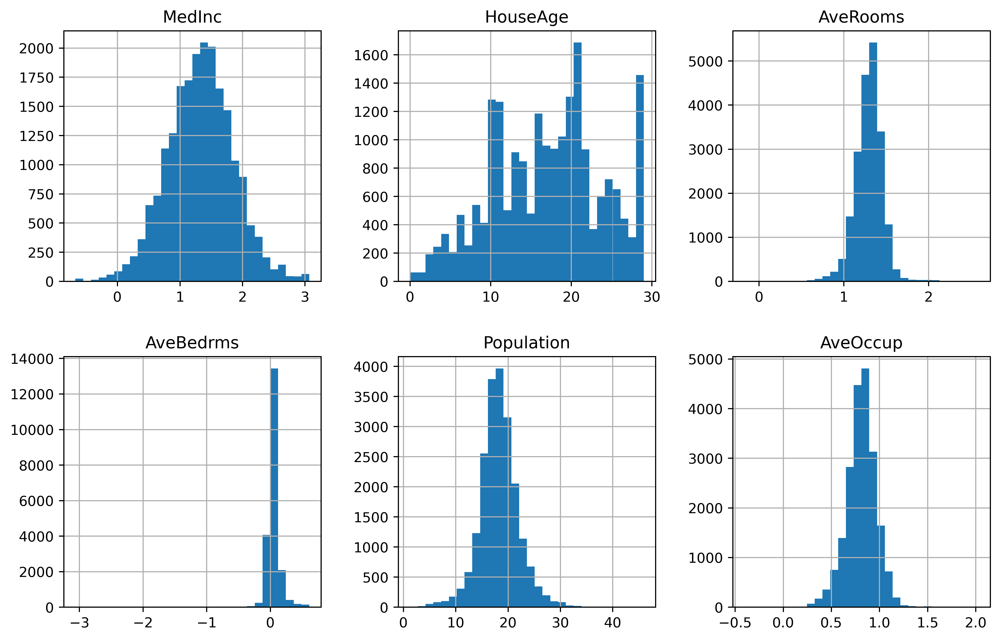

In [77]:
# Plot histograms to inspect variable distributions

X_tf.hist(bins=30, figsize=(12, 12), layout=(3, 3))
plt.show()

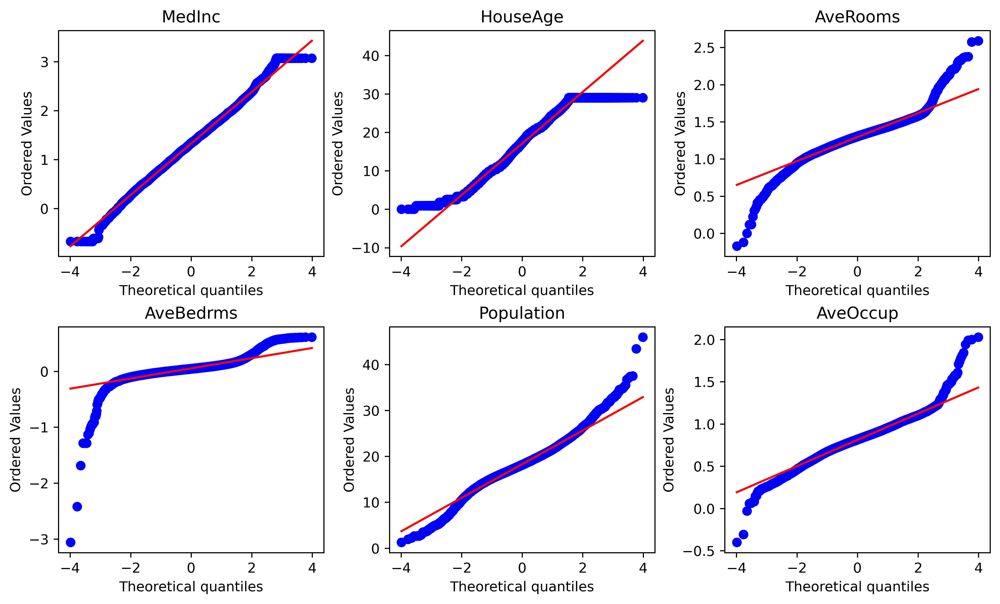

In [78]:
# Make Q-Q plots for all variables

make_qqplot(X_tf)

# Yeo-Johnson transformation

In [79]:
import pandas as pd

# for plotting
import matplotlib.pyplot as plt

# for Q-Q plots
import scipy.stats as stats

# the dataset for the demo
from sklearn.datasets import fetch_california_housing

# with open-source packages
from sklearn.preprocessing import PowerTransformer

In [80]:
# load the California House price data from Scikit-learn
X, y = fetch_california_housing(return_X_y=True, as_frame=True)

# drop lat and lon
X.drop(labels=["Latitude", "Longitude"], axis=1, inplace=True)

# display top 5 rows
X.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467


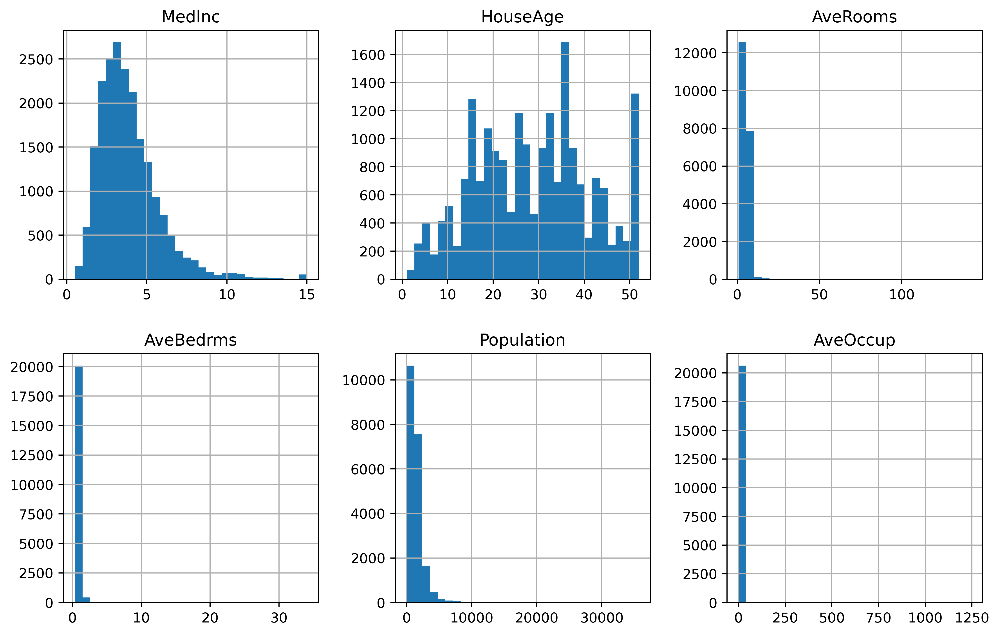

In [81]:
# Plot histograms to inspect variable distributions

X.hist(bins=30, figsize=(12, 12), layout=(3, 3))
plt.show()

In [82]:
# capture variable names in a list

variables = list(X.columns)

variables

['MedInc', 'HouseAge', 'AveRooms', 'AveBedrms', 'Population', 'AveOccup']

In [83]:
# Make Q-Q plots for all variables


def make_qqplot(df):

    plt.figure(figsize=(10, 6), constrained_layout=True)

    for i in range(6):

        # location in figure
        ax = plt.subplot(2, 3, i + 1)

        # variable to plot
        var = variables[i]

        # q-q plot
        stats.probplot((df[var]), dist="norm", plot=plt)

        # add variable name as title
        ax.set_title(var)

    plt.show()

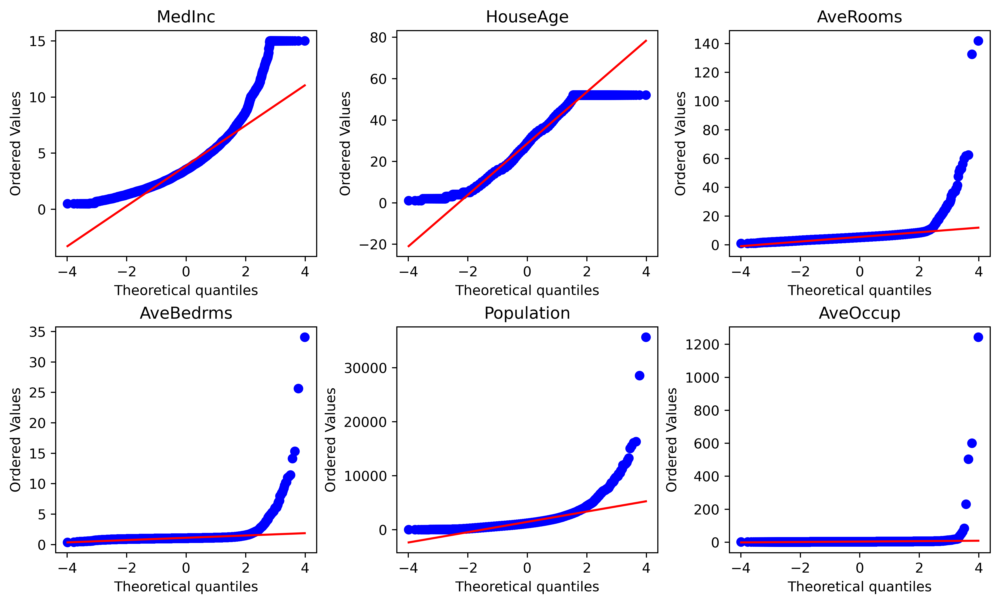

In [84]:
make_qqplot(X)

# Yeo-Johnson transformation with Scikit-learn

In [85]:
# initialize a transformer with yeo-johnson

transformer = PowerTransformer(method="yeo-johnson", standardize=False)

In [86]:
# fit transformer: transformer will learn the lambdas

transformer.fit(X)

PowerTransformer(standardize=False)

In [87]:
# lambdas are stored in a transformer attribute

transformer.lambdas_

array([-0.19850989,  0.80814809, -0.5536698 , -4.39408222,  0.23352364,
       -0.90134563])

In [88]:
# transform data: returns NumPy array

X_tf = transformer.transform(X)

X_tf

array([[ 1.80359864, 24.13344395,  1.23437156,  0.21730344, 12.22322374,
         0.7558211 ],
       [ 1.80195768, 13.80736684,  1.20246042,  0.21606014, 22.08794362,
         0.71044476],
       [ 1.72457855, 29.38077791,  1.28031155,  0.21834124, 13.97068781,
         0.77657017],
       ...,
       [ 0.90146241, 11.55509421,  1.14875904,  0.21920155, 17.2479839 ,
         0.73385779],
       [ 0.95050153, 12.12644493,  1.15591917,  0.22004504, 15.76140519,
         0.71198436],
       [ 1.08383361, 10.97761774,  1.15162557,  0.21989608, 18.91795897,
         0.76123875]])

In [89]:
# transform NumPy array to pandas dataframe

X_tf = pd.DataFrame(X_tf, columns=variables)

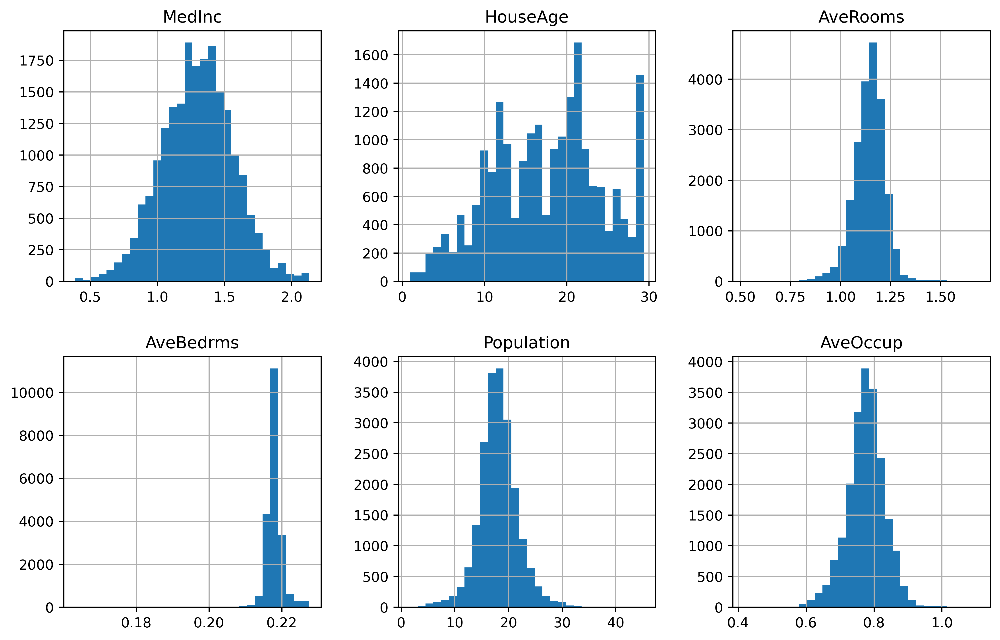

In [90]:
# Plot histograms to inspect variable distributions

X_tf.hist(bins=30, figsize=(12, 12), layout=(3, 3))
plt.show()

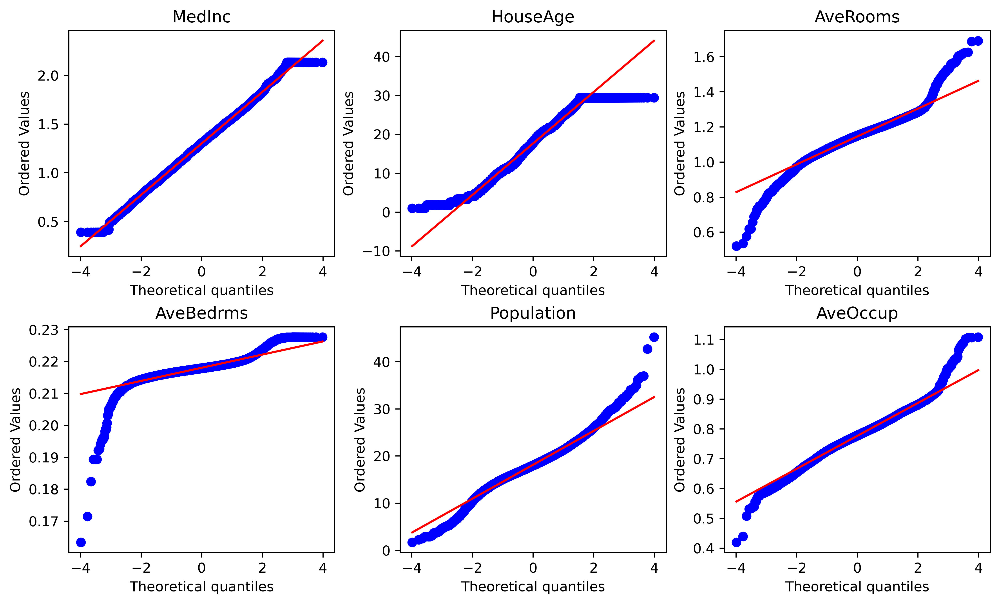

In [91]:
# Make Q-Q plots for all variables

make_qqplot(X_tf)

# Yeo-Johnson transformation with SciPy

One variable at a time.

In [92]:
# make a copy of the dataframe where we will store the modified
# variables

X_tf = X.copy()

Optimal λ:  -0.1985098937827175


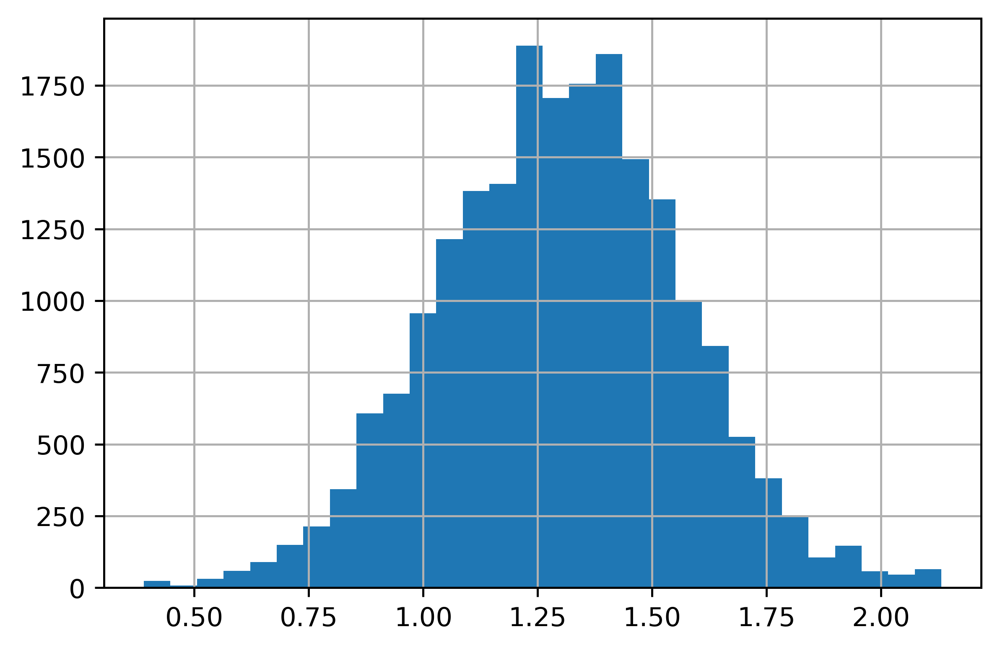

In [93]:
# apply the Box-Cox transformation to variable MedInc
X_tf["MedInc"], param = stats.yeojohnson(X["MedInc"])

# print the optimal lambda found for MedInc
print("Optimal λ: ", param)

# visualize the transformed variable
X_tf["MedInc"].hist(bins=30)
plt.show()

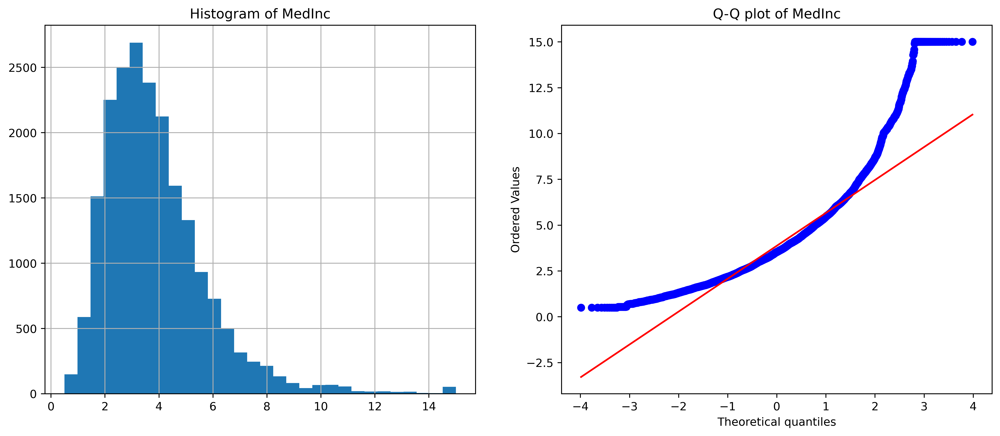

In [94]:
diagnostic_plots(X, 'MedInc')

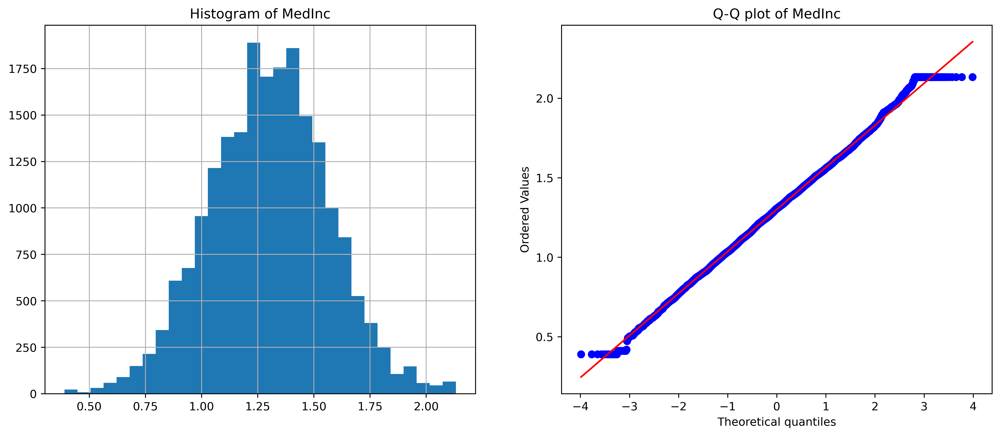

In [95]:
diagnostic_plots(X_tf, 'MedInc')